# Problem Statement

A Chinese automobile company Geely Auto aspires to enter the Nigerian market by setting up its manufacturing unit and producing cars locally to compete with their Nigerian, US and European counterparts.
They have contacted you, a Data Scientist to understand the factors on which the pricing of cars depends. Specifically, they want to understand the factors affecting the pricing of cars in the Nigerian market, since those may be very different from the Chinese market. 
The company wants to know:
●	Which variables are significant in predicting the price of a car
●	How well do those variables describe the price of a car
Based on various market surveys, you have gathered a large data set of different types of cars across the Nigerian market.


# Business Goal (Objective)

You are required to model the price of cars with the available independent variables. The management will use it to understand how exactly the prices vary with the independent variables. They can accordingly manipulate the design of the cars, the business strategy etc. to meet certain price levels. Further, the model will be a good way for management to understand the pricing dynamics of a new market.


In [3]:
# Importing necessary Libraries
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Importing the dataset
data_frame = pd.read_csv('CarPrice_data.csv')
data_frame.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [5]:
# checking the shape of the datast
data_frame.shape

(205, 26)

In [6]:
# Getting some necessary attributes of the data
data_frame.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


In [7]:
# Chceking for missing values in the dataset
data_frame.isnull().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [8]:
# Identifying individual columns in the dataset
data_frame.columns

Index(['car_ID', 'symboling', 'CarName', 'fueltype', 'aspiration',
       'doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase',
       'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype',
       'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price'],
      dtype='object')

In [9]:
# Checking for duplicated values in the data set
data_frame.duplicated().sum()

0

In [10]:
# Getting necesssary information of the datset
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

## EDA (Exploratory Data Analysis)

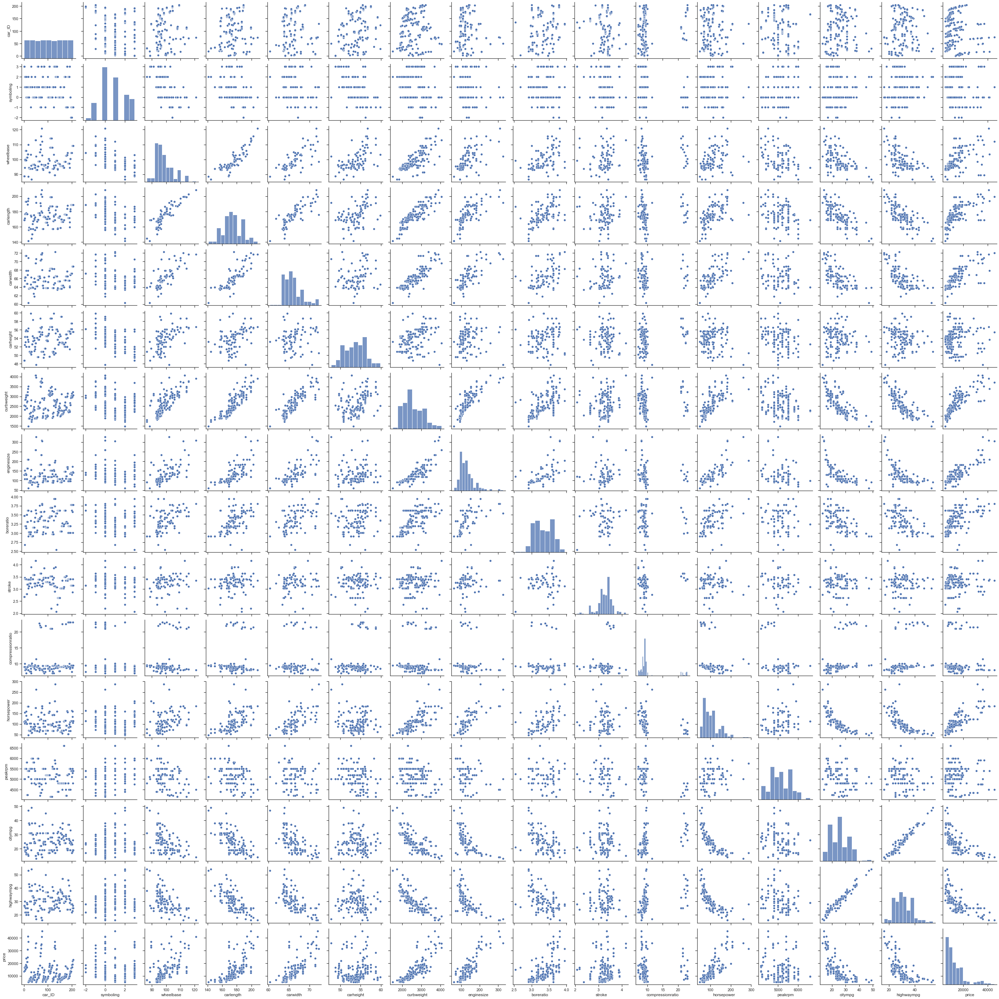

In [361]:
# A pairplot to identify relationships that exist among variables in the dataset
sns.set(style = 'ticks', color_codes = True)

sns.pairplot(data_frame)

In [11]:
# Various correlations among numerical variables in the dataset
data_frame.corr()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
car_ID,1.000000,-0.151621,0.129729,0.170636,0.052387,0.255960,0.071962,-0.033930,0.260064,-0.160824,0.150276,-0.015006,-0.203789,0.015940,0.011255,-0.109093
symboling,-0.151621,1.000000,-0.531954,-0.357612,-0.232919,-0.541038,-0.227691,-0.105790,-0.130051,-0.008735,-0.178515,0.070873,0.273606,-0.035823,0.034606,-0.079978
wheelbase,0.129729,-0.531954,1.000000,0.874587,0.795144,0.589435,0.776386,0.569329,0.488750,0.160959,0.249786,0.353294,-0.360469,-0.470414,-0.544082,0.577816
carlength,0.170636,-0.357612,0.874587,1.000000,0.841118,0.491029,0.877728,0.683360,0.606454,0.129533,0.158414,0.552623,-0.287242,-0.670909,-0.704662,0.682920
carwidth,0.052387,-0.232919,0.795144,0.841118,1.000000,0.279210,0.867032,0.735433,0.559150,0.182942,0.181129,0.640732,-0.220012,-0.642704,-0.677218,0.759325
carheight,0.255960,-0.541038,0.589435,0.491029,0.279210,1.000000,0.295572,0.067149,0.171071,-0.055307,0.261214,-0.108802,-0.320411,-0.048640,-0.107358,0.119336
curbweight,0.071962,-0.227691,0.776386,0.877728,0.867032,0.295572,1.000000,0.850594,0.648480,0.168790,0.151362,0.750739,-0.266243,-0.757414,-0.797465,0.835305
enginesize,-0.033930,-0.105790,0.569329,0.683360,0.735433,0.067149,0.850594,1.000000,0.583774,0.203129,0.028971,0.809769,-0.244660,-0.653658,-0.677470,0.874145
boreratio,0.260064,-0.130051,0.488750,0.606454,0.559150,0.171071,0.648480,0.583774,1.000000,-0.055909,0.005197,0.573677,-0.254976,-0.584532,-0.587012,0.553173
stroke,-0.160824,-0.008735,0.160959,0.129533,0.182942,-0.055307,0.168790,0.203129,-0.055909,1.000000,0.186110,0.080940,-0.067964,-0.042145,-0.043931,0.079443


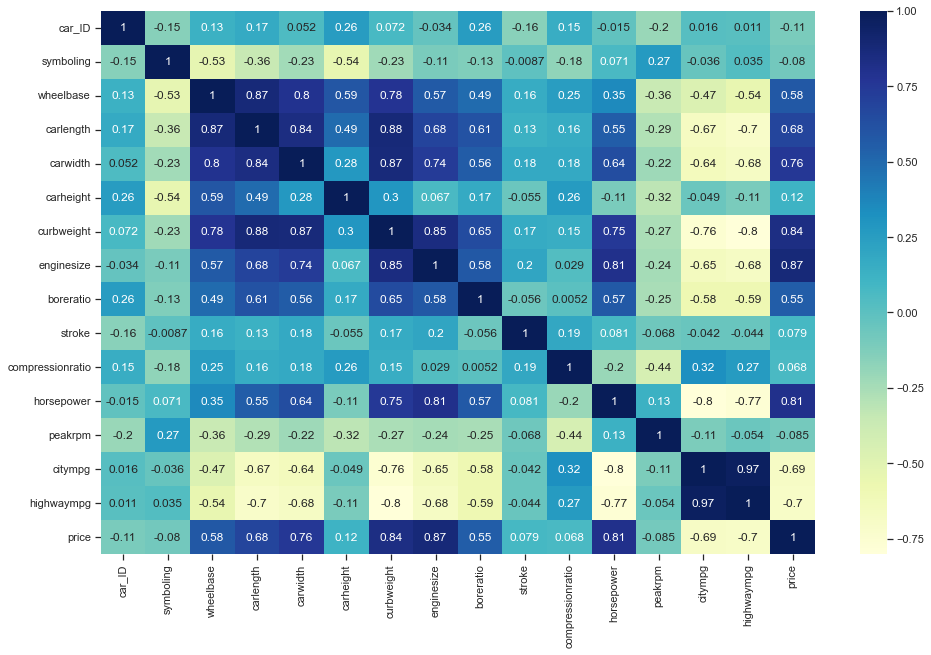

In [363]:
# A heatmap to visualize the correlations among the numerical variables
plt.figure(figsize = (16, 10))
cor= data_frame.corr()
sns.heatmap(cor, annot = True, cmap="YlGnBu")
plt.show()

In [12]:
# Importing profiling library
from pandas_profiling import ProfileReport

In [13]:
# Getting a profile report of the dataset
data_frame.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

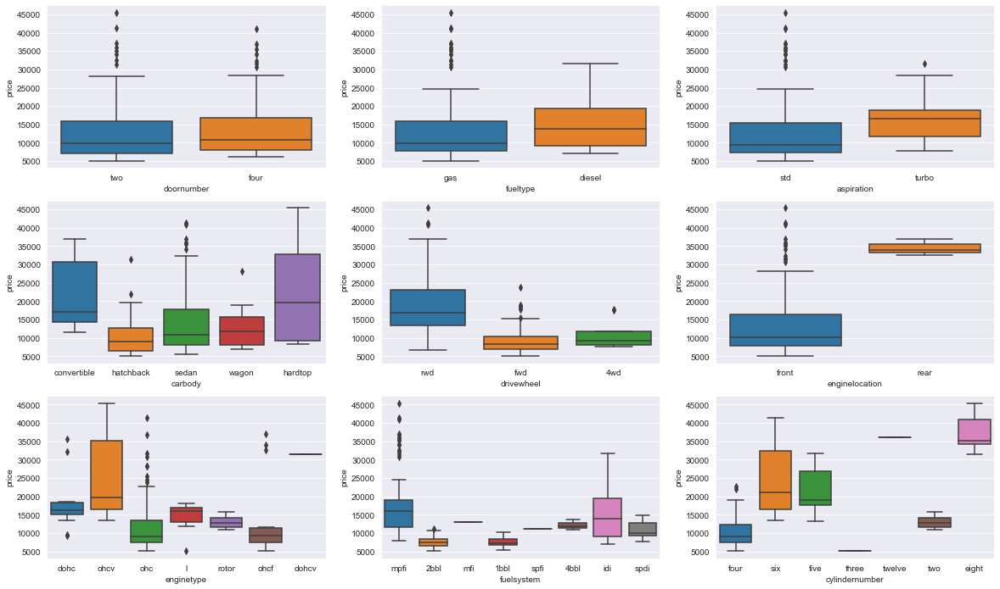

In [14]:
# Visualizing the categorical variables using boxplot
sns.set_style('darkgrid')
plt.figure(figsize=(20,12))
plt.subplot(3,3,1)
sns.boxplot(x='doornumber',y='price',data=data_frame)
plt.subplot(3,3,2)
sns.boxplot(x='fueltype',y='price',data=data_frame)
plt.subplot(3,3,3)
sns.boxplot(x='aspiration',y='price',data=data_frame)
plt.subplot(3,3,4)
sns.boxplot(x='carbody',y='price',data=data_frame)
plt.subplot(3,3,5)
sns.boxplot(x='drivewheel',y='price',data=data_frame)
plt.subplot(3,3,6)
sns.boxplot(x='enginelocation',y='price',data=data_frame)
plt.subplot(3,3,7)
sns.boxplot(x='enginetype',y='price',data=data_frame)
plt.subplot(3,3,8)
sns.boxplot(x='fuelsystem',y='price',data=data_frame)
plt.subplot(3,3,9)
sns.boxplot(x='cylindernumber',y='price',data=data_frame)
plt.show()

**Observations:**   <br>
- Fuel type have an effect on the pricing of the cars.
-Engine location and aspiration surely has a visible effect on the pricing of the car
-The price of real wheel drive is significantly higher than other drive wheel options.
-Cylinder number and engine type also seem to regulate the price of cars.
-Hardtop and convertible cars are definitely priced higher than other body types available. Also car body is contributing in determining the price.
-Diesel Cars has comparatively more car prices than gas car. 
-Turbo aspiration has more prices 
-Hardtop and convertible carbody has higher prices than others 
-Rwd has higher avg. prices.
-Rear enginelocation has very high price comparitively with front location. 
-Prices are affected by numbers of cylindernumber.
-Doornumbers dont affect the prices of a car

<AxesSubplot:xlabel='price', ylabel='Density'>

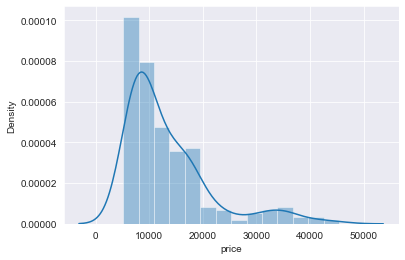

In [15]:
#A plot for the dependent variable-price
sns.distplot(data_frame['price'])

In [76]:
# numerical features of the dataset
numeric_features=data_frame.describe().columns
numeric_features

Index(['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price', 'car_area', 'car_vol', 'mileage', 'car_density', 'price_mean',
       'company_cat'],
      dtype='object')

In [369]:
data_frame.symboling.unique()

array([ 3,  1,  2,  0, -1, -2], dtype=int64)

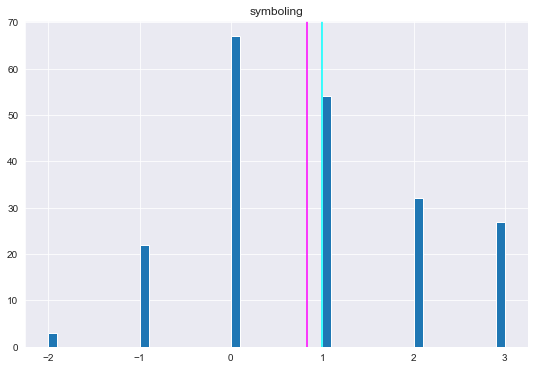

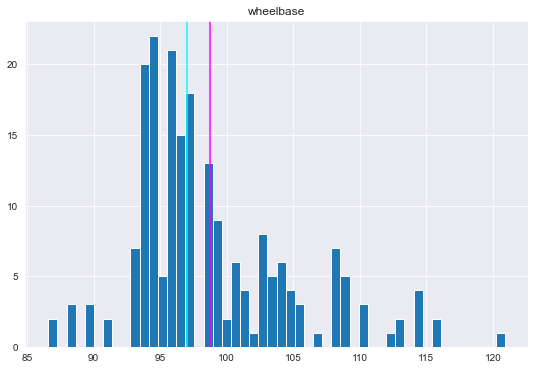

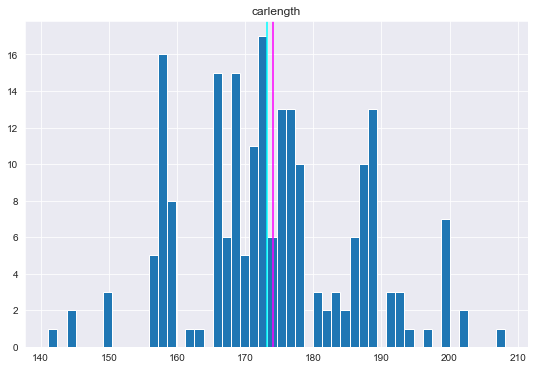

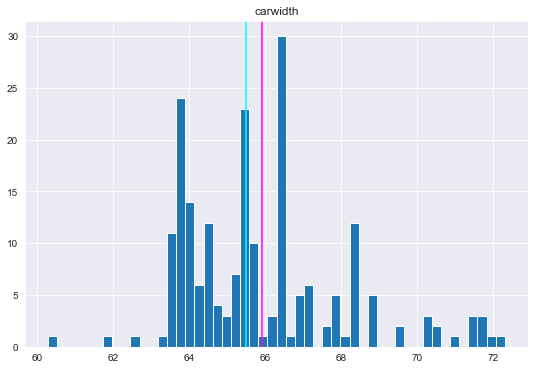

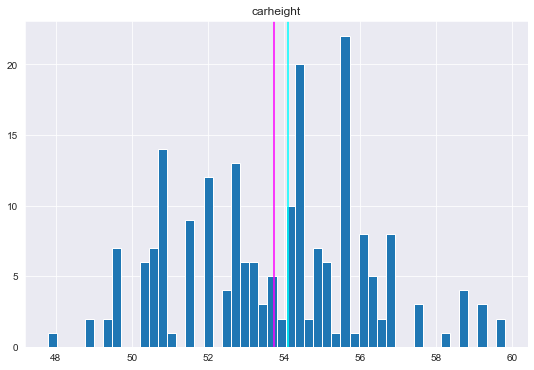

...

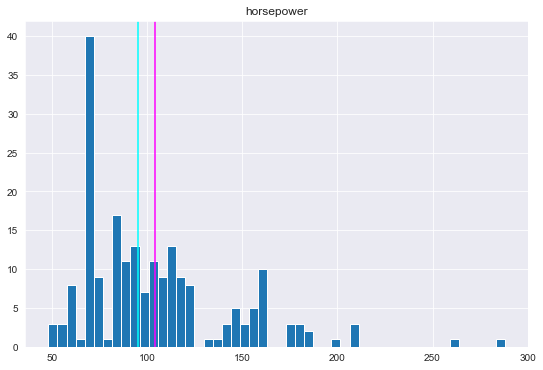

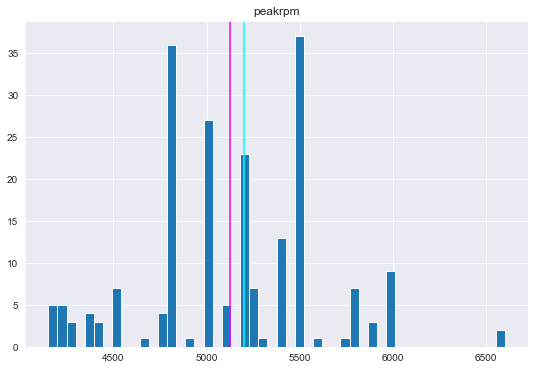

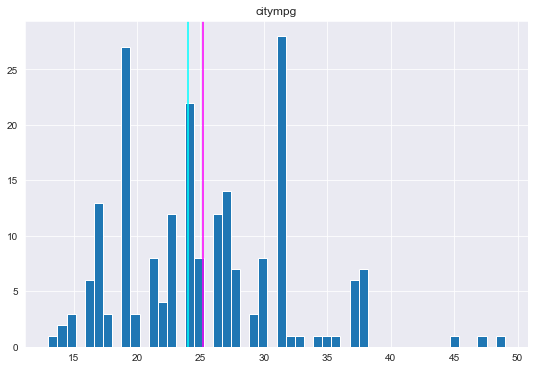

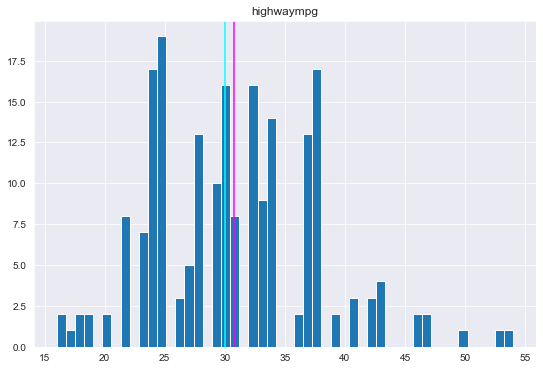

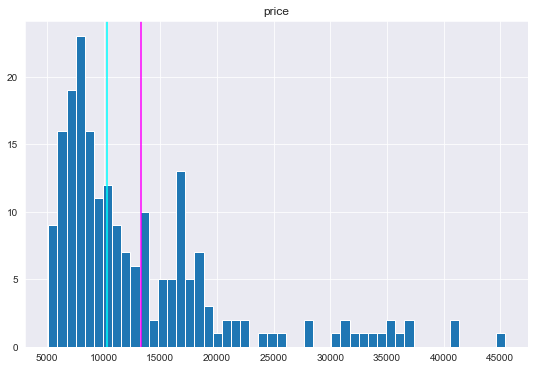

In [17]:
# Hist Visualizations for individual numerical variables.
for col in numeric_features[1:]:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature=(data_frame[col])
  feature.hist(bins=50,ax=ax)
  ax.axvline(feature.mean(),color='magenta')
  ax.axvline(feature.median(),color='cyan')
  ax.set_title(col)
plt.show()

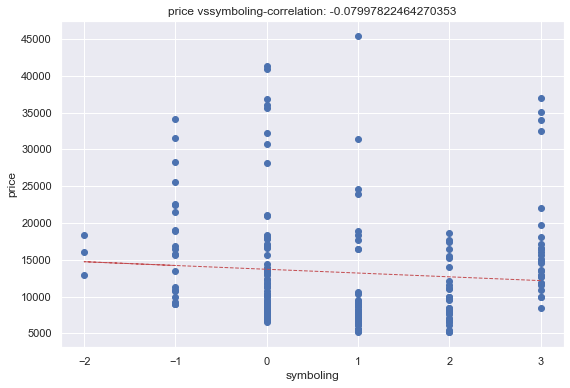

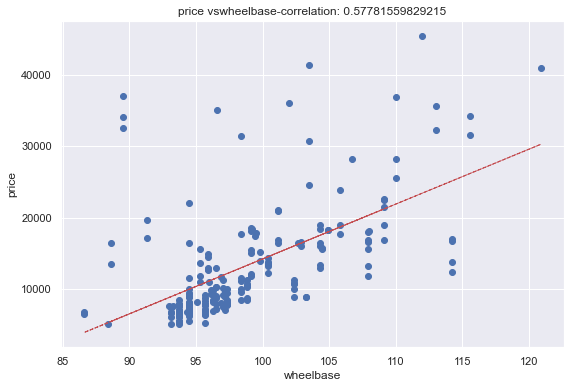

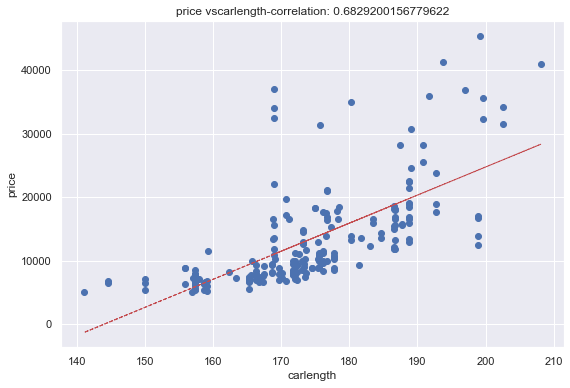

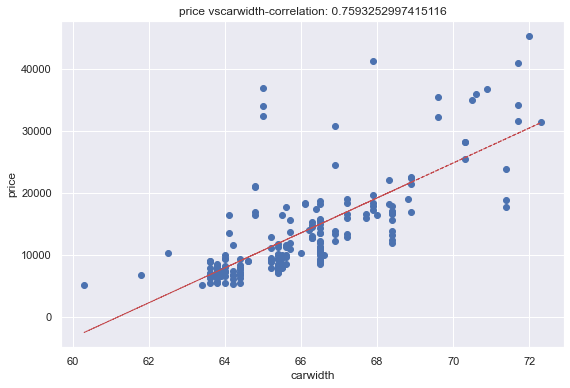

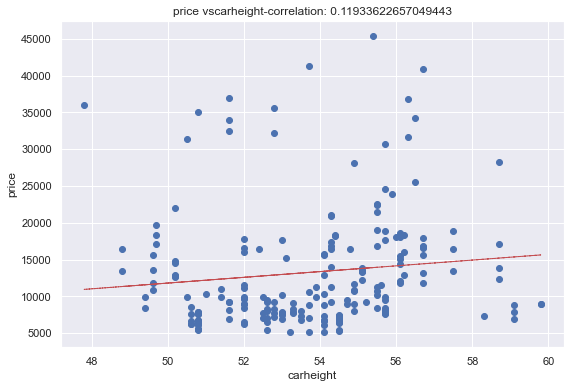

...

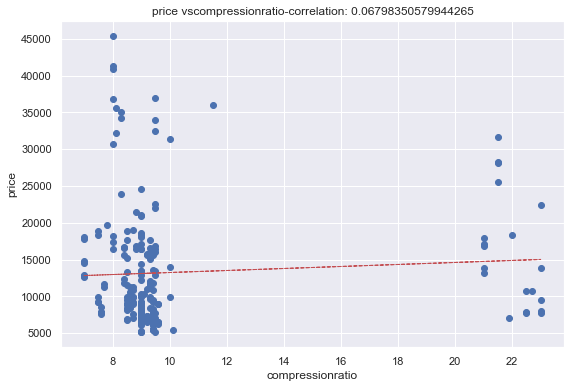

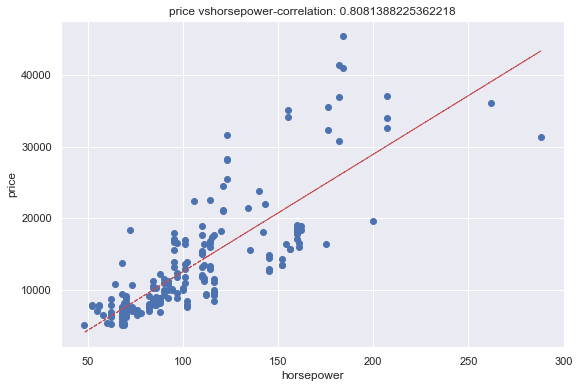

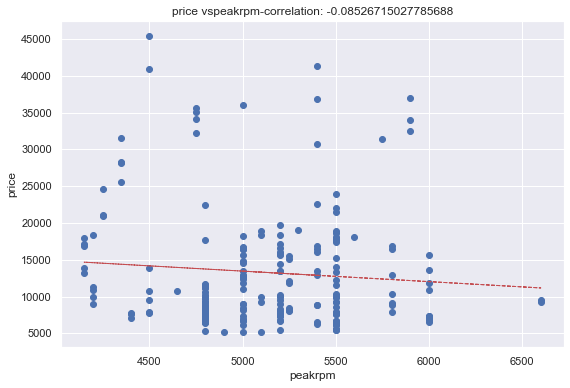

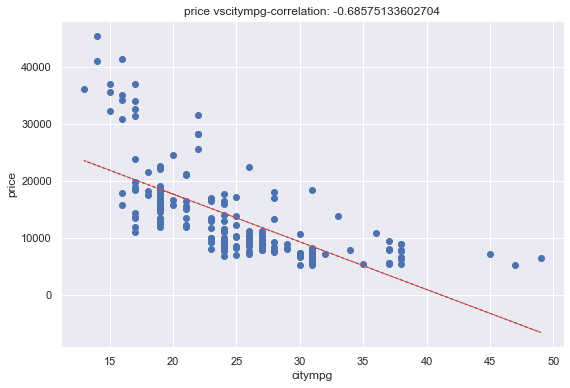

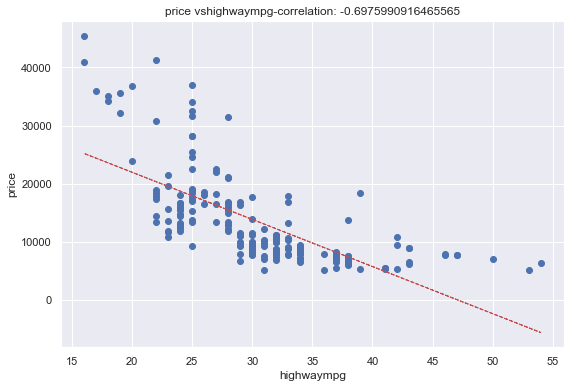

In [371]:
# A scatterplot of dependent variable (price) vs other numerical features  
    
for col in numeric_features[1:-1]:
    fig=plt.figure(figsize=(9,6))
    ax=fig.gca()
    feature=(data_frame[col])
    label=data_frame['price']
    correlation=feature.corr(label)
    plt.scatter(x=feature,y=label)
    plt.xlabel(col)
    plt.ylabel('price')
    ax.set_title('price vs'+col+'-correlation: '+str(correlation))
    z=np.polyfit(data_frame[col],data_frame['price'],1)
    y_hat=np.poly1d(z)(data_frame[col])
    plt.plot(data_frame[col],y_hat,"r--",lw=1)
plt.show()

Let's see how the prices vary with the different automobile companies in the Nigeria market

In [18]:
categorical_variables = list(data_frame.columns[data_frame.dtypes == 'object'])
categorical_variables

['CarName',
 'fueltype',
 'aspiration',
 'doornumber',
 'carbody',
 'drivewheel',
 'enginelocation',
 'enginetype',
 'cylindernumber',
 'fuelsystem']

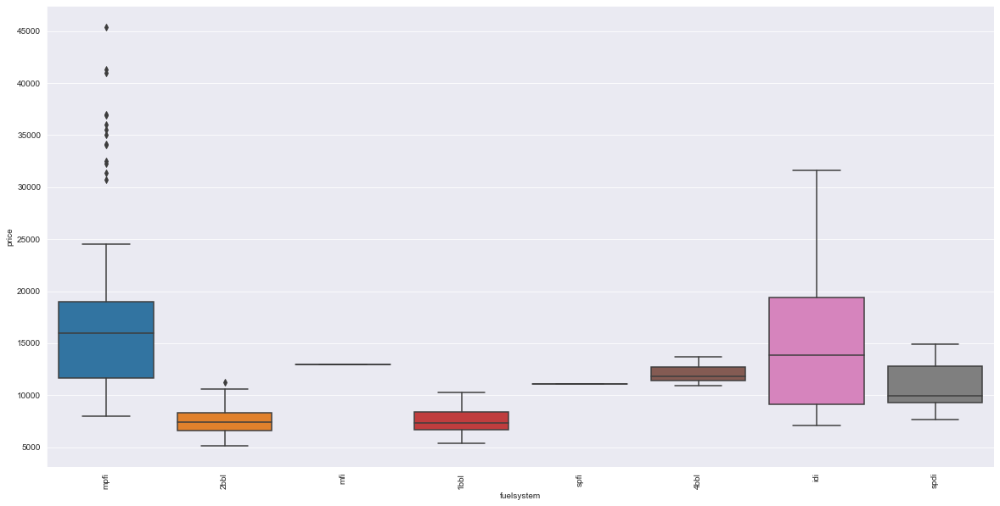

Average Nigeria car price:  13276.710570731706
CarName
buick regal sport coupe (turbo)    45400.0
bmw x5                             41315.0
buick century special              40960.0
porsche boxter                     37028.0
jaguar xk                          36000.0
Name: price, dtype: float64


In [74]:
plt.figure(figsize=(20,10))
sns.boxplot(x = categorical_variables[-1], y = 'price', data = data_frame)
plt.xticks(rotation=90)
plt.show()
print('Average Nigeria car price: ',data_frame['price'].mean())
print(data_frame.groupby('CarName').price.mean().sort_values(ascending=False).head())

## DATA PREPROCESSING

In [19]:
# Importing Necessary Libraries For Data Preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

### VIF is Variance Inflation factor. It quantifies the extent of correlation between one predictor and the other predictors in a model. It is used for diagnosing collinearity/multicollinearity. We see that there are a few variables which have an infinite/large VIF. These variables aren't of use. But manual elimination is time consuming and makes the code unnecessarily long. So let's try and build a model with features this time using RFE.

In [20]:
#multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [23]:
# Measuring of collinearity among predictor variables
calc_vif(data_frame[[i for i in data_frame.describe().columns if i not in ['car_ID','symboling','price','citympg','highwaympg','company_cat','price_mean','carwidth','carlength','carheight','car_vol','car_den','wheelbase','car_area','peakrpm','stroke','horsepower','car_density','boreratio','curbweight']]])

,variables,VIF
0,enginesize,4.749302
1,compressionratio,4.749302


In [24]:
data_frame['car_area']=data_frame['carlength']*data_frame['carwidth']

In [25]:
data_frame['car_area'].head()

0    10820.08
1    10820.08
2    11213.60
3    11690.92
4    11726.24
Name: car_area, dtype: float64

In [26]:
data_frame['car_vol']=data_frame['car_area']*data_frame['carheight']
data_frame['car_vol'].head()

0    528019.904
1    528019.904
2    587592.640
3    634816.956
4    636734.832
Name: car_vol, dtype: float64

In [27]:
data_frame['mileage']=0.7*data_frame['citympg']+0.3*data_frame['highwaympg']
data_frame['mileage'].head()

0    22.8
1    22.8
2    21.1
3    25.8
4    19.2
Name: mileage, dtype: float64

In [28]:
data_frame['car_density']=data_frame['curbweight']*data_frame['car_area']
data_frame['car_density'].head()

0    27569563.84
1    27569563.84
2    31655992.80
3    27321680.04
4    33114901.76
Name: car_density, dtype: float64

In [29]:
numerical_features = ['enginesize','compressionratio','mileage']

In [30]:
data_frame['CarName'].unique()

array(['alfa-romero giulia', 'alfa-romero stelvio',
       'alfa-romero Quadrifoglio', 'audi 100 ls', 'audi 100ls',
       'audi fox', 'audi 5000', 'audi 4000', 'audi 5000s (diesel)',
       'bmw 320i', 'bmw x1', 'bmw x3', 'bmw z4', 'bmw x4', 'bmw x5',
       'chevrolet impala', 'chevrolet monte carlo', 'chevrolet vega 2300',
       'dodge rampage', 'dodge challenger se', 'dodge d200',
       'dodge monaco (sw)', 'dodge colt hardtop', 'dodge colt (sw)',
       'dodge coronet custom', 'dodge dart custom',
       'dodge coronet custom (sw)', 'honda civic', 'honda civic cvcc',
       'honda accord cvcc', 'honda accord lx', 'honda civic 1500 gl',
       'honda accord', 'honda civic 1300', 'honda prelude',
       'honda civic (auto)', 'isuzu MU-X', 'isuzu D-Max ',
       'isuzu D-Max V-Cross', 'jaguar xj', 'jaguar xf', 'jaguar xk',
       'maxda rx3', 'maxda glc deluxe', 'mazda rx2 coupe', 'mazda rx-4',
       'mazda glc deluxe', 'mazda 626', 'mazda glc', 'mazda rx-7 gs',
       'mazda glc 

In [31]:
data_frame['company'] = data_frame['CarName'].str.split(" ", expand=True)[0]
data_frame['company'] = data_frame['company'].replace({'toyouta': 'Toyota','vw':'Volkswagen','vokswagen':'Volkswagen',
                                                      'maxda':'Mazda','porcshce':'Porsche'})

In [32]:
# Value counts for individual car companies
data_frame['company'] = data_frame['company'].str.title()
data_frame['company'].value_counts()

Toyota         32
Nissan         18
Mazda          17
Mitsubishi     13
Honda          13
Volkswagen     12
Subaru         12
Peugeot        11
Volvo          11
Dodge           9
Buick           8
Bmw             8
Audi            7
Plymouth        7
Saab            6
Porsche         5
Isuzu           4
Jaguar          3
Chevrolet       3
Alfa-Romero     3
Renault         2
Mercury         1
Name: company, dtype: int64

#### Toyota is comparatively more favorable car and mercury is least favourable car

In [33]:
# Categorical features from the data frame
categorical_features = data_frame.describe(include=['object','category']).columns
categorical_features

Index(['CarName', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation', 'enginetype', 'cylindernumber',
       'fuelsystem', 'company'],
      dtype='object')

In [34]:
data_frame.describe(include=['object','category']).columns

Index(['CarName', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation', 'enginetype', 'cylindernumber',
       'fuelsystem', 'company'],
      dtype='object')

In [35]:
data_frame.carbody.value_counts()

sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
Name: carbody, dtype: int64

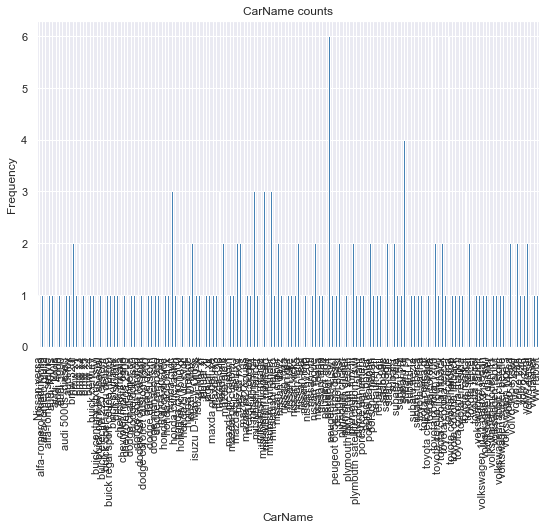

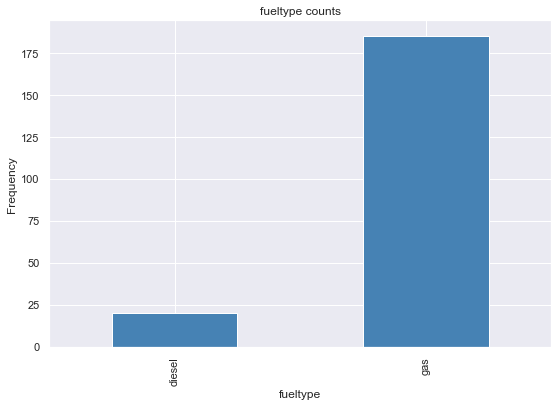

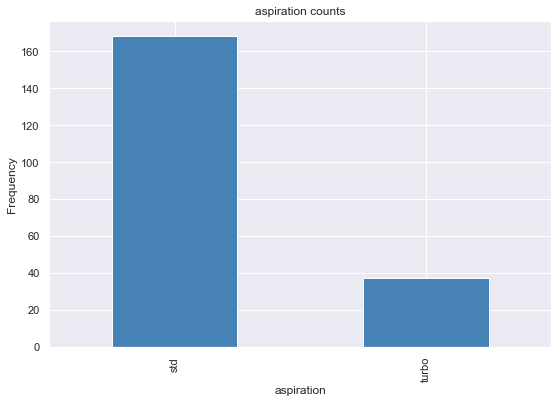

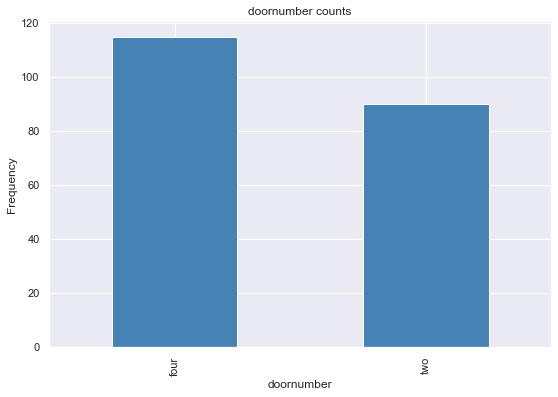

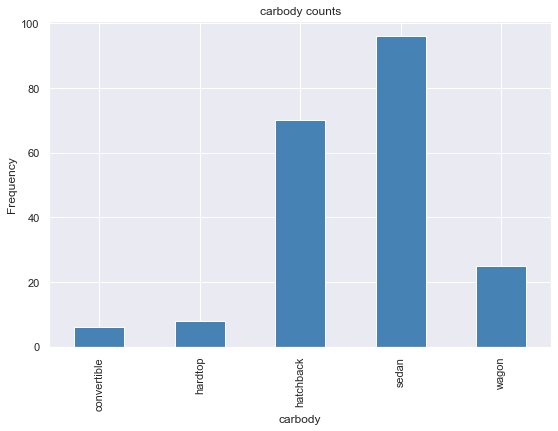

...

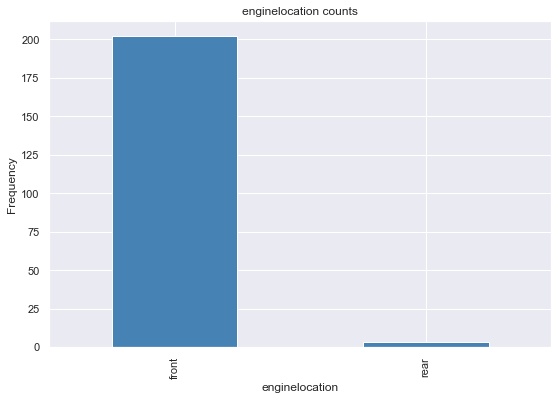

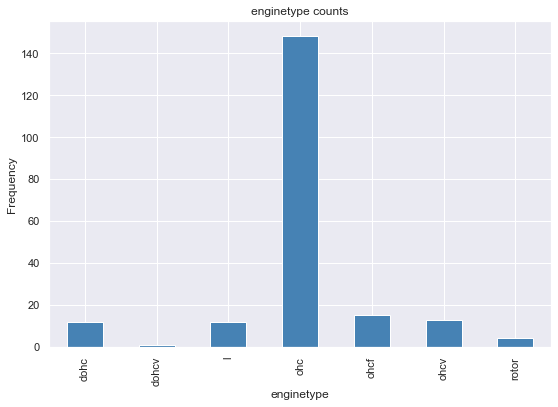

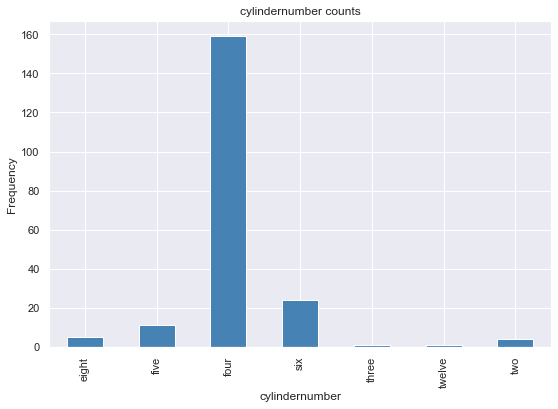

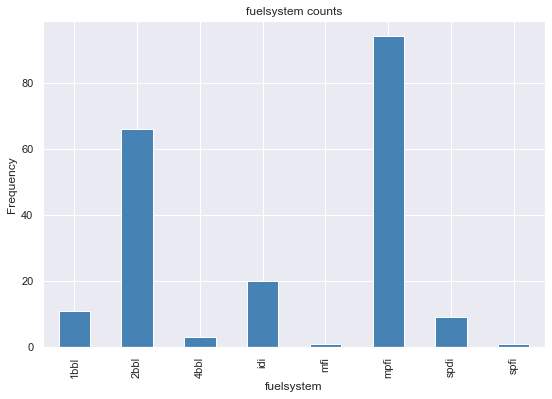

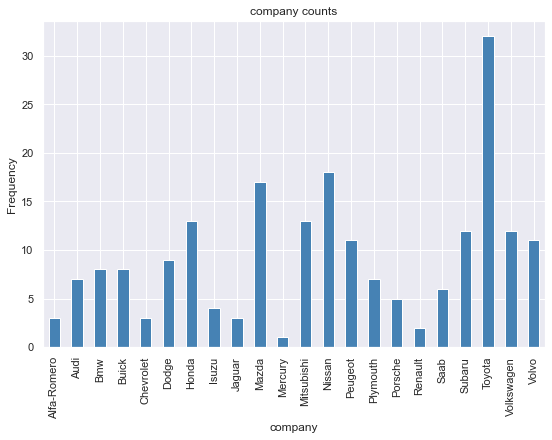

In [389]:
# plot a bar plot for each categorical feature count  

for col in categorical_features:
    counts = data_frame[col].value_counts().sort_index()
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    counts.plot.bar(ax = ax, color='steelblue')
    ax.set_title(col + ' counts')
    ax.set_xlabel(col) 
    ax.set_ylabel("Frequency")
plt.show()

<Figure size 1440x432 with 0 Axes>

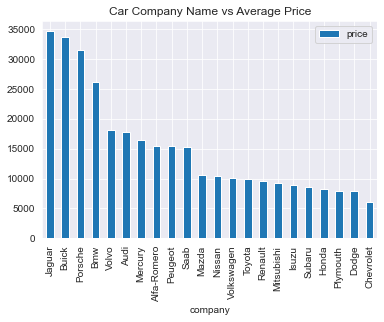

In [37]:
# Car Company vs Average Price
plt.figure(figsize=(20, 6))

df_autox = pd.DataFrame(data_frame.groupby(['company'])['price'].mean().sort_values(ascending = False))
df_autox.plot.bar()
plt.title('Car Company Name vs Average Price')
plt.show()

In [38]:
df_autox.rename(columns={'price':'price_mean'},inplace=True)

In [39]:
df_autox

,price_mean
company,
Jaguar,34600.000000
Buick,33647.000000
Porsche,31400.500000
Bmw,26118.750000
Volvo,18063.181818
Audi,17859.166714
Mercury,16503.000000
Alfa-Romero,15498.333333
Peugeot,15489.090909


In [40]:
data_frame = data_frame.merge(df_autox,on = 'company',how = 'left')

In [41]:
data_frame['company_cat'] = data_frame['price_mean'].apply(lambda x : 0 if x < 12000 else (1 if 12000 <= x < 24000 else 2))

In [42]:
data_frame.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,citympg,highwaympg,price,car_area,car_vol,mileage,car_density,company,price_mean,company_cat
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,21,27,13495.0,10820.08,528019.904,22.8,27569563.84,Alfa-Romero,15498.333333,1
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,21,27,16500.0,10820.08,528019.904,22.8,27569563.84,Alfa-Romero,15498.333333,1
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,19,26,16500.0,11213.60,587592.640,21.1,31655992.80,Alfa-Romero,15498.333333,1
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,24,30,13950.0,11690.92,634816.956,25.8,27321680.04,Audi,17859.166714,1
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,18,22,17450.0,11726.24,636734.832,19.2,33114901.76,Audi,17859.166714,1


In [43]:
data_frame.shape

(205, 33)

In [44]:
data_frame_pr = data_frame.copy()

In [45]:
data_frame_pr.shape

(205, 33)

In [46]:
data_frame.fuelsystem.value_counts()

mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
mfi      1
spfi     1
Name: fuelsystem, dtype: int64

In [47]:
### Data encoding
#label encoding
encoders_nums = {"fueltype":{"diesel":1,"gas":0},
                 "aspiration":{"turbo":1,"std":0},
                 "doornumber":     {"four": 4, "two": 2},
                 "drivewheel":{"fwd":0,"4wd":0,"rwd":1},
                 "cylindernumber":{"four": 4, "six": 6, "five": 5, "eight": 8,
                                  "two": 2, "twelve": 12, "three":3 }
                 }

data_frame_pr = data_frame_pr.replace(encoders_nums)

In [48]:
# One hot encoding
data_frame_pr = pd.get_dummies(data_frame_pr, columns=["carbody", "enginetype","fuelsystem"], prefix=["body", "etype","fsystem"])

In [49]:
data_frame_pr.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,drivewheel,enginelocation,wheelbase,carlength,...,etype_ohcv,etype_rotor,fsystem_1bbl,fsystem_2bbl,fsystem_4bbl,fsystem_idi,fsystem_mfi,fsystem_mpfi,fsystem_spdi,fsystem_spfi
0,1,3,alfa-romero giulia,0,0,2,1,front,88.6,168.8,...,0,0,0,0,0,0,0,1,0,0
1,2,3,alfa-romero stelvio,0,0,2,1,front,88.6,168.8,...,0,0,0,0,0,0,0,1,0,0
2,3,1,alfa-romero Quadrifoglio,0,0,2,1,front,94.5,171.2,...,1,0,0,0,0,0,0,1,0,0
3,4,2,audi 100 ls,0,0,4,0,front,99.8,176.6,...,0,0,0,0,0,0,0,1,0,0
4,5,2,audi 100ls,0,0,4,0,front,99.4,176.6,...,0,0,0,0,0,0,0,1,0,0


In [50]:
data_frame_pr.shape

(205, 50)

In [51]:
features = numerical_features.copy()
features.extend(['fueltype','aspiration','doornumber','drivewheel','cylindernumber','company_cat','body_convertible',
       'body_hardtop', 'body_hatchback', 'body_sedan', 'body_wagon','etype_dohc', 'etype_l', 'etype_ohc', 'etype_ohcf',
       'etype_ohcv','fsystem_1bbl', 'fsystem_2bbl','fsystem_idi', 'fsystem_mpfi','fsystem_spdi'])

In [52]:
features

['enginesize',
 'compressionratio',
 'mileage',
 'fueltype',
 'aspiration',
 'doornumber',
 'drivewheel',
 'cylindernumber',
 'company_cat',
 'body_convertible',
 'body_hardtop',
 'body_hatchback',
 'body_sedan',
 'body_wagon',
 'etype_dohc',
 'etype_l',
 'etype_ohc',
 'etype_ohcf',
 'etype_ohcv',
 'fsystem_1bbl',
 'fsystem_2bbl',
 'fsystem_idi',
 'fsystem_mpfi',
 'fsystem_spdi']

In [53]:
from scipy.stats import zscore
#Train test split
# numeric_cols = carprice.select_dtypes(include=[np.number]).columns
X = data_frame_pr[features].apply(zscore)

In [54]:
y = np.log10(data_frame_pr['price'])

In [55]:
y

0      4.130173
1      4.217484
2      4.217484
3      4.144574
4      4.241795
         ...   
200    4.226471
201    4.279781
202    4.332135
203    4.351603
204    4.354589
Name: price, Length: 205, dtype: float64

In [56]:
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split( X,y , test_size = 0.2, random_state = 0) 
print(X_train.shape)
print(X_test.shape)

(164, 24)
(41, 24)


# LINEAR REGRESSION MODEL

In [67]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
reg=LinearRegression().fit(X_train,y_train)

In [68]:
model.fit(X_train,y_train)

LinearRegression()

In [69]:
print(model.intercept_)

4.059795437224572


In [70]:
reg.score(X_train,y_train)

0.9329024395361993

In [412]:
reg.coef_

array([ 0.07631416,  0.01662958, -0.0573054 ,  0.00152684,  0.02139611,
        0.01527878,  0.01259594,  0.00070597,  0.06533837,  0.01424367,
        0.00031291, -0.00027087,  0.00041203, -0.00775795, -0.04048577,
       -0.05045497, -0.06468959, -0.03595474, -0.04413501, -0.0001415 ,
       -0.01738664,  0.00152684,  0.01774035, -0.00764412])

In [60]:
y_pred=reg.predict(X_test)
y_pred

array([3.82042699, 4.13923569, 4.17731218, 3.55965877, 4.00879077,
       4.08730208, 3.77958323, 3.86992526, 4.15623894, 3.87621427,
       4.33203932, 4.57653353, 4.11427382, 4.05713873, 3.7976254 ,
       4.08511504, 4.04192902, 4.18356581, 3.92931744, 3.85305143,
       3.97415497, 4.1357782 , 4.03427844, 4.08511504, 4.15037561,
       3.84298629, 3.87416881, 4.11124447, 3.89277718, 3.83713456,
       3.96249915, 3.9887581 , 4.32233581, 4.00373234, 3.86792192,
       4.45661022, 4.07539094, 4.17475128, 3.82026867, 4.62435177,
       3.76683804])

# Model Evaluation

In [61]:
from sklearn.metrics import mean_squared_error
MSE  = mean_squared_error(10**(y_test), 10**(y_pred))
print("MSE :" , MSE)
RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)
from sklearn.metrics import r2_score
r2 = r2_score(10**(y_test), 10**(y_pred))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MSE : 9019828.930480277
RMSE : 3003.3030034414237
R2 : 0.8834893666194826
Adjusted R2 :  0.7087234165487066


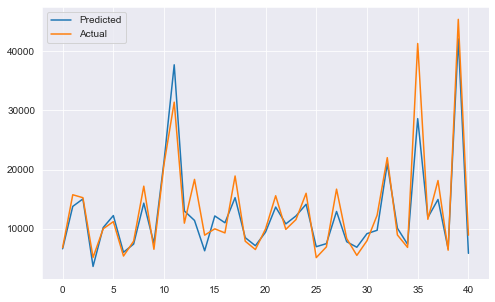

In [62]:
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred))
plt.plot(np.array(10**(y_test)))
plt.legend(["Predicted","Actual"])
plt.show()

Text(0, 0.5, 'y_pred')

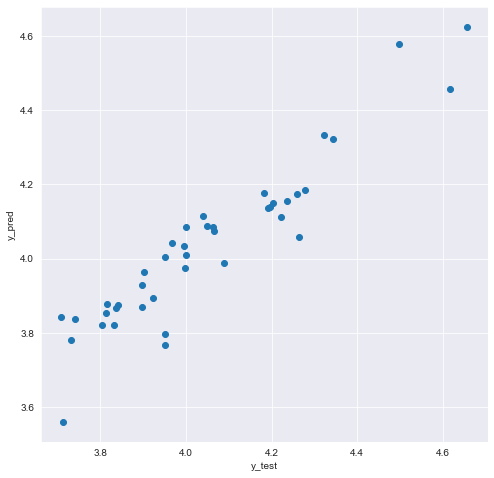

In [71]:
plt.figure(figsize=(8,8))
plt.scatter(y_test, y_pred,)
plt.xlabel('y_test')
plt.ylabel('y_pred')

### The variables which are significant in predicting the price of a car are: enginesize, carwidth, enginetype, wheel base, car length, horse power, curb weight, bore ratio, stroke, compression ratio.